In [1]:
import os
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel
import pickle
import copy
import torch
import torch.serialization
import torch.nn as nn
import torch.nn.functional as F
import gpytorch
from gpytorch.models import ExactGP
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.mlls import ExactMarginalLogLikelihood
#from gp_pytorch_accelerated import GPModel
import warnings

warnings.filterwarnings('ignore')

In [2]:
os.chdir(r"C:\Users\dweis\OneDrive\Documents\Career\Research Paper")

In [3]:
def seed_everything(seed=42):

    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [4]:
from src.data_loading import load_wind_data, extract_timeseries, split_timeperiods, normalise_timeseries
from src.vae_models import extract_vae_features, TimeSeriesVAE
from src.clustering import assign_test_clusters
from src.gp import create_cluster_forecasting_datasets, GPModel
from src.plotting import plot_cluster_predictions

In [ ]:
# Load target wind farm data
target_csv_path = r'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Data\Data_Per_Wind_Farm\Gemini.csv'
target_df = load_wind_data(target_csv_path)

cols_to_drop = [c for c in target_df.columns if 'Scaled_Windspeed' in c or 'Power_of_' in c]
target_df = target_df.drop(columns=cols_to_drop)
target_df['farm_id'] = 'Kriegers'




# Load source farm metadata
with open(fr'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\63\all_combinations_2.0.pkl', 'rb') as f:
    all_combinations = pickle.load(f)

best_key = max(all_combinations, key=lambda k: all_combinations[k]['combined_score'])
optimal_config = all_combinations[best_key]
source_results = {'optimal_config': optimal_config}

Loading wind data from C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Data\Data_Per_Wind_Farm\Gemini.csv
  Loaded: 17520 hours
  Power range: 0.0 - 600.0 MW
  Power mean: 417.8 MW ± 198.9 MW


In [ ]:
def transfer_learning_gp(target_df, source_results, data_fraction=0.1, 
                         gp_dir="results", plot_predictions_flag=False, random_state=42):
    
    print("="*80)
    print("GP TRANSFER LEARNING")
    print("="*80)
    
    # Extract source configuration
    optimal_config = source_results['optimal_config']
    n_clusters = optimal_config['k_clusters']
    time_period_hours = optimal_config['time_period_hours']
    source_vae = optimal_config['vae']
    source_train_latent = optimal_config['train_latent']
    source_train_labels = optimal_config['train_cluster_labels']
    
    # Get source scalers
    source_scalers_vae = optimal_config['scalers_vae']
    source_log_transforms_vae = optimal_config.get('log_transforms_vae', {})
    source_scalers_full = optimal_config['scalers_full']
    source_log_transforms_full = optimal_config.get('log_transforms_full', {})
    
    source_vae.eval()
    
    print(f"Configuration: {time_period_hours}h periods, {n_clusters} clusters")
    print(f"Target data: {data_fraction*100:.1f}% training")
    
    # DATA PREPARATION
    
    print("\nExtracting and Splitting...")
    timeseries_matrix_full_t, timeseries_matrix_vae_t, period_info_t = extract_timeseries(target_df, time_period_hours)
    
    test_ratio = 1.0 - data_fraction
    split_data_vae = split_timeperiods(timeseries_matrix_vae_t, period_info_t, test_ratio=test_ratio, random_state=random_state)
    
    train_indices = split_data_vae['train_indices']
    test_indices = split_data_vae['test_indices']
    train_period_info = split_data_vae['train_period_info']
    test_period_info = split_data_vae['test_period_info']
    
    train_timeseries_full_t = timeseries_matrix_full_t[train_indices]
    test_timeseries_full_t = timeseries_matrix_full_t[test_indices]
    train_timeseries_vae_t = split_data_vae['train_timeseries']
    test_timeseries_vae_t = split_data_vae['test_timeseries']
    
    # Normalisation
    vae_feature_names = ['Windspeed', 'fsr', 'u100', 'v100', 'wind_dir_sin', 'wind_dir_cos']
    train_normalised_vae_t = np.zeros_like(train_timeseries_vae_t, dtype=np.float32)
    test_normalised_vae_t = np.zeros_like(test_timeseries_vae_t, dtype=np.float32)

    for ch in range(train_timeseries_vae_t.shape[1]):
        channel_name = vae_feature_names[ch] if ch < len(vae_feature_names) else f'Channel_{ch}'
        if any(cyc in channel_name for cyc in ['sin', 'cos']):
            train_normalised_vae_t[:, ch, :] = train_timeseries_vae_t[:, ch, :]
            test_normalised_vae_t[:, ch, :] = test_timeseries_vae_t[:, ch, :]
            continue
        if channel_name in source_scalers_vae: 
            scaler_vae = source_scalers_vae[channel_name]   
            train_flat = train_timeseries_vae_t[:, ch, :].flatten()
            test_flat = test_timeseries_vae_t[:, ch, :].flatten()
            if source_log_transforms_vae.get(channel_name, False):
                train_flat = np.log(train_flat + 1e-10)
                test_flat = np.log(test_flat + 1e-10)
            train_scaled = scaler_vae.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler_vae.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_vae_t[:, ch, :] = train_scaled.reshape(train_timeseries_vae_t.shape[0], -1)
            test_normalised_vae_t[:, ch, :] = test_scaled.reshape(test_timeseries_vae_t.shape[0], -1)
        else:
             train_normalised_vae_t[:, ch, :] = train_timeseries_vae_t[:, ch, :]
             test_normalised_vae_t[:, ch, :] = test_timeseries_vae_t[:, ch, :]

    target_power_scaler = MinMaxScaler(feature_range=(-1, 1))
    raw_train_power = train_timeseries_full_t[:, 0, :].flatten().reshape(-1, 1)
    target_power_scaler.fit(raw_train_power)

    full_feature_names = [
        'Power', 'Windspeed', 'fsr', 'u100', 'v100',
        'Power_t-1', 'Power_t-2', 'Power_t-3',
        'Windspeed_t-1', 'Windspeed_t-2', 'Windspeed_t-3',
        'hour_sin', 'hour_cos', 'wind_dir_sin', 'wind_dir_cos',
        'month_sin', 'month_cos'
    ]

    train_normalised_full_t = np.zeros_like(train_timeseries_full_t, dtype=np.float32)
    test_normalised_full_t = np.zeros_like(test_timeseries_full_t, dtype=np.float32)

    for ch in range(train_timeseries_full_t.shape[1]):
        channel_name = full_feature_names[ch] if ch < len(full_feature_names) else f'Channel_{ch}'
        if any(cyc in channel_name for cyc in ['sin', 'cos']):
            train_normalised_full_t[:, ch, :] = train_timeseries_full_t[:, ch, :]
            test_normalised_full_t[:, ch, :] = test_timeseries_full_t[:, ch, :]
        elif 'Power' in channel_name:
            scaler = target_power_scaler
            train_flat = train_timeseries_full_t[:, ch, :].flatten()
            test_flat = test_timeseries_full_t[:, ch, :].flatten()
            train_scaled = scaler.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_full_t[:, ch, :] = train_scaled.reshape(train_timeseries_full_t.shape[0], -1)
            test_normalised_full_t[:, ch, :] = test_scaled.reshape(test_timeseries_full_t.shape[0], -1)
        elif channel_name in source_scalers_full:
            scaler = source_scalers_full[channel_name]
            train_flat = train_timeseries_full_t[:, ch, :].flatten()
            test_flat = test_timeseries_full_t[:, ch, :].flatten()
            if source_log_transforms_full.get(channel_name, False):
                train_flat = np.log(train_flat + 1e-10)
                test_flat = np.log(test_flat + 1e-10)
            train_scaled = scaler.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_full_t[:, ch, :] = train_scaled.reshape(train_timeseries_full_t.shape[0], -1)
            test_normalised_full_t[:, ch, :] = test_scaled.reshape(test_timeseries_full_t.shape[0], -1)
        else:
             train_normalised_full_t[:, ch, :] = train_timeseries_full_t[:, ch, :]
             test_normalised_full_t[:, ch, :] = test_timeseries_full_t[:, ch, :]

    train_latent_matrix_t = extract_vae_features(source_vae, train_normalised_vae_t, device='cpu')
    test_latent_matrix_t = extract_vae_features(source_vae, test_normalised_vae_t, device='cpu')
    
    train_cluster_labels_t = assign_test_clusters(source_train_latent, train_latent_matrix_t, source_train_labels)
    test_cluster_labels_t = assign_test_clusters(source_train_latent, test_latent_matrix_t, source_train_labels)
    all_source_clusters = sorted(np.unique(source_train_labels))
    
    train_cluster_dataset = create_cluster_forecasting_datasets(
        train_latent_matrix_t, train_normalised_full_t, train_cluster_labels_t,
        period_indices=np.arange(len(train_latent_matrix_t)),
        period_info=train_period_info,
        forecast_horizon=1
    )
    test_cluster_dataset = create_cluster_forecasting_datasets(
        test_latent_matrix_t, test_normalised_full_t, test_cluster_labels_t,
        period_indices=np.arange(len(test_latent_matrix_t)),
        period_info=test_period_info,
        forecast_horizon=1
    )
    
    def clean_dataset(dataset_dict):
        keys_to_remove = []
        for k in list(dataset_dict.keys()):
            X, y = dataset_dict[k]['X'], dataset_dict[k]['y']
            mask = ~np.isnan(X).any(axis=1) & ~np.isnan(y)
            dataset_dict[k]['X'] = X[mask]
            dataset_dict[k]['y'] = y[mask]
            if len(dataset_dict[k]['X']) == 0:
                keys_to_remove.append(k)
        for k in keys_to_remove:
            del dataset_dict[k]
            
    clean_dataset(train_cluster_dataset)
    clean_dataset(test_cluster_dataset)
    
    # FINE-TUNING
    
    print("\nStep 7: Loading and fine-tuning GP models...")
    print(f"  Fine-tuning iterations: 100")
    print(f"  Learning rate: 0.1") 
    
    cluster_models = {}
    device = 'cpu'
    
    for cluster_id in all_source_clusters:
        if cluster_id not in train_cluster_dataset or cluster_id not in test_cluster_dataset:
            continue
        
        train_data = train_cluster_dataset[cluster_id]
        test_data = test_cluster_dataset[cluster_id]
        X_train, y_train = train_data['X'], train_data['y']
        X_test, y_test = test_data['X'], test_data['y']
        
        if len(X_train) < 10:
            continue
        
        print(f"\nCluster {cluster_id} ({len(X_train)} samples):", end=" ")
        
        gp_path = os.path.join(gp_dir, f"gp_cluster_{cluster_id}_{time_period_hours}h_{n_clusters}k.pkl")
        if not os.path.exists(gp_path):
            print("Skipped (no source model)")
            continue
        
        try:
            # Load Source Model State
            _original_restore_location = torch.serialization.default_restore_location
            torch.serialization.default_restore_location = lambda storage, location: _original_restore_location(storage, 'cpu')
            try:
                with open(gp_path, 'rb') as f:
                    checkpoint = pickle.load(f)
            finally:
                torch.serialization.default_restore_location = _original_restore_location
            
            if isinstance(checkpoint, dict):
                source_model = checkpoint.get('gp_model', checkpoint.get('gp'))
            else:
                source_model = checkpoint
            
            source_model = source_model.cpu()
            
            train_x = torch.FloatTensor(X_train).to(device)
            train_y = torch.FloatTensor(y_train).to(device)
            test_x = torch.FloatTensor(X_test).to(device)
            
            # Initialise Likelihood 
            target_likelihood = GaussianLikelihood(noise_constraint=None).to(device)
            target_model = GPModel(train_x, train_y, target_likelihood).to(device)
            
            # 3. Load hyperparameters
            source_state = source_model.state_dict()
            model_state = target_model.state_dict()
            
            pretrained_dict = {k: v for k, v in source_state.items() 
                               if k in model_state and 'likelihood' not in k}
            
            model_state.update(pretrained_dict)
            target_model.load_state_dict(model_state)
            
            # Train
            target_model.train()
            target_likelihood.train()
            
            optimizer = torch.optim.Adam(target_model.parameters(), lr=0.1)
            mll = ExactMarginalLogLikelihood(target_likelihood, target_model)
            
            for i in range(100):
                optimizer.zero_grad()
                output = target_model(train_x)
                loss = -mll(output, train_y)
                loss.backward()
                optimizer.step()
            
            # Evaluate
            target_model.eval()
            target_likelihood.eval()
            
            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                predictions = target_likelihood(target_model(test_x))
                y_pred = predictions.mean.cpu().numpy()
                y_std = predictions.stddev.cpu().numpy()
            
            # Inverse Transform & Metrics
            y_test_mw = target_power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
            y_pred_mw = target_power_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel()
            max_capacity = target_power_scaler.data_max_[0]
            y_pred_mw = np.clip(y_pred_mw, 0, max_capacity)
            
            mw_range = max_capacity - target_power_scaler.data_min_[0]
            feature_range_width = 2.0
            y_std_mw = y_std * (mw_range / feature_range_width)
            
            mae = mean_absolute_error(y_test_mw, y_pred_mw)
            r2 = r2_score(y_test_mw, y_pred_mw)
            rmse = np.sqrt(mean_squared_error(y_test_mw, y_pred_mw))

            print(f"MAE: {mae:.1f} MW, R²: {r2:.3f}")
            
            cluster_models[cluster_id] = {
                'gp': target_model,
                'likelihood': target_likelihood,
                'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_test': len(y_test)},
                'predictions_mw': y_pred_mw,
                'actuals_mw': y_test_mw,
                'uncertainties_mw': y_std_mw
            }
        
        except Exception as e:
            print(f"Error: {e}")
            continue
    
    if cluster_models:
        maes = [m['metrics']['mae'] for m in cluster_models.values()]
        weights = [m['metrics']['n_test'] for m in cluster_models.values()]
        total = sum(weights)
        w_mae = sum(m * w for m, w in zip(maes, weights)) / total
        
        mae_arr = np.array(maes)
        w_arr = np.array(weights) / total
        mae_std = np.sqrt(np.sum(w_arr * (mae_arr - w_mae)**2))
        
        r2s = [m['metrics']['r2'] for m in cluster_models.values()]
        r2_arr = np.array(r2s)
        w_r2 = np.sum(r2_arr * w_arr)
        r2_std = np.sqrt(np.sum(w_arr * (r2_arr - w_r2)**2))
        
        rmses = [m['metrics']['rmse'] for m in cluster_models.values()]
        rmse_arr = np.array(rmses)
        w_rmse = np.sum(rmse_arr * w_arr)
        rmse_std = np.sqrt(np.sum(w_arr * (rmse_arr - w_rmse)**2))

        print(f"\nOVERALL RESULTS:")
        print(f"MAE:  {w_mae:.2f} ± {mae_std:.2f} MW")
        print(f"R²:   {w_r2:.3f} ± {r2_std:.3f}")
        print(f"RMSE: {w_rmse:.2f} ± {rmse_std:.2f} MW")
        
        overall_metrics = {
            'mae_mean': w_mae, 'mae_std': mae_std,
            'r2_mean': w_r2, 'r2_std': r2_std,
            'rmse_mean': w_rmse, 'rmse_std': rmse_std
        }
    else:
        overall_metrics = {}

    if plot_predictions_flag and cluster_models:
        plotting_config = {
            'time_period_hours': time_period_hours,
            'k_clusters': n_clusters,
            'scalers': {'Power': target_power_scaler} 
        }
        
        final_results = {'cluster_gp_models': {}}
        for cluster_id, model_info in cluster_models.items():
            model_metrics = model_info['metrics'].copy()
            model_metrics.update({
                'actual_original': model_info['actuals_mw'],
                'predictions_original': model_info['predictions_mw'],
                'uncertainties_original': model_info['uncertainties_mw']
            })
            final_results['cluster_gp_models'][cluster_id] = {'metrics': model_metrics}
        
        plot_cluster_predictions(final_results, plotting_config, plot_hours=72)

    return {
        'cluster_models': cluster_models,
        'overall_metrics': overall_metrics,
        'data_fraction': data_fraction,
        'random_state': random_state
    }


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 10.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 4 rows
  Extracted: 2919 periods (skipped 0 discontinuous blocks)
  Full: (2919, 18, 6), VAE: (2919, 6, 6)
Timeseries randomly split into 291 train periods and 2628 test periods
Assigning test periods to clusters
  Test latent features Shape: (291, 8)
  Cluster 0: 42 test periods
  Cluster 1: 43 test periods
  Cluster 2: 38 test periods
  Cluster 3: 50 test periods
  Cluster 4: 49 test periods
  Cluster 5: 10 test periods
  Cluster 6: 36 test periods
  Cluster 7: 23 test periods
Assigning test periods to clusters
  Test latent features Shape: (2628, 8)
  Cluster 0: 323 test periods
  Cluster 1: 347 test periods
  Cluster 2: 399 test periods
  Cluster 3: 487 test periods
  Cluster 4: 346 test periods
  Cluster 5: 164 test periods
  Cluster 6: 373 test periods
  Cluster 7: 189 test periods
Clust

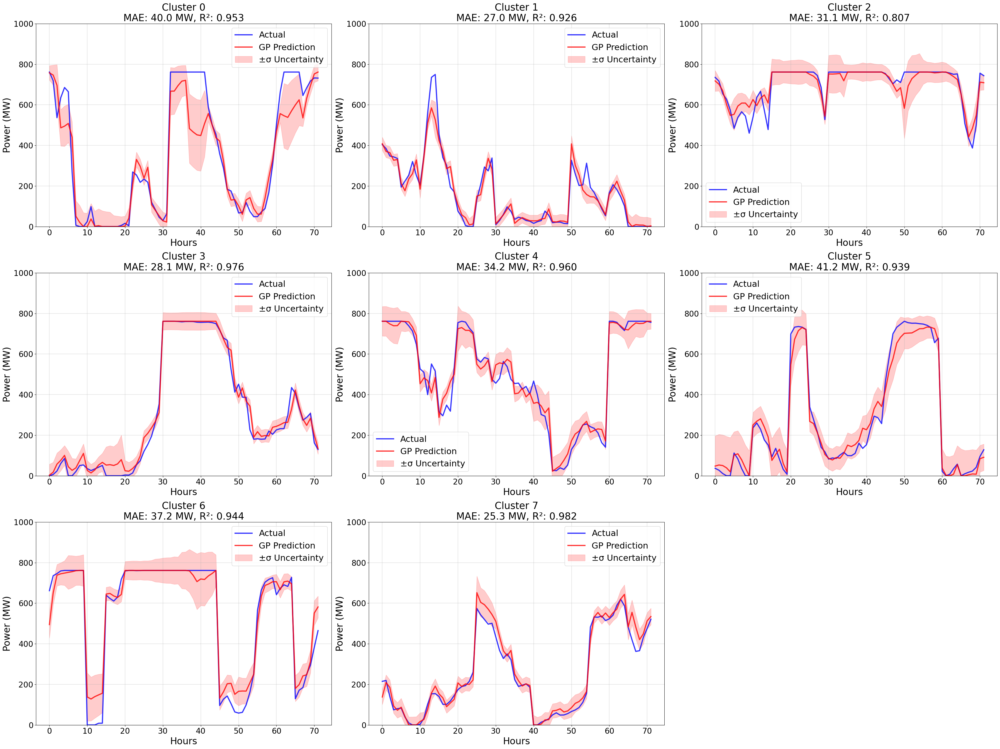


Prediction Plot Summary:
Cluster 0: MAE=40.0 MW, R²=0.953 (1612 test points)
Cluster 1: MAE=27.0 MW, R²=0.926 (1735 test points)
Cluster 2: MAE=31.1 MW, R²=0.807 (1995 test points)
Cluster 3: MAE=28.1 MW, R²=0.976 (2435 test points)
Cluster 4: MAE=34.2 MW, R²=0.960 (1730 test points)
Cluster 5: MAE=41.2 MW, R²=0.939 (820 test points)
Cluster 6: MAE=37.2 MW, R²=0.944 (1865 test points)
Cluster 7: MAE=25.3 MW, R²=0.982 (945 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 20.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 4 rows
  Extracted: 2919 periods (skipped 0 discontinuous blocks)
  Full: (2919, 18, 6), VAE: (2919, 6, 6)
Timeseries randomly split into 583 train periods and 2336 test periods
Assigning test periods to clusters
  Test latent features Shape: (583, 8)
  Cluster 0: 78 test periods
  Cluster 1: 78 test periods
  Cluster 2: 85 test periods
  Cluster 3: 108 test per

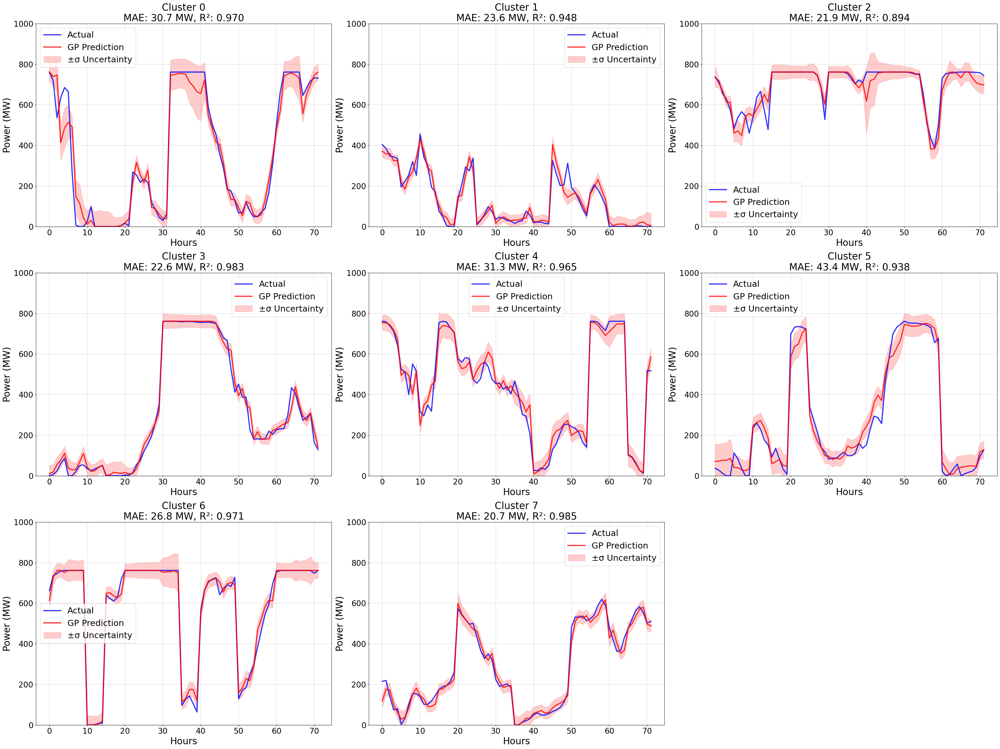


Prediction Plot Summary:
Cluster 0: MAE=30.7 MW, R²=0.970 (1432 test points)
Cluster 1: MAE=23.6 MW, R²=0.948 (1560 test points)
Cluster 2: MAE=21.9 MW, R²=0.894 (1760 test points)
Cluster 3: MAE=22.6 MW, R²=0.983 (2145 test points)
Cluster 4: MAE=31.3 MW, R²=0.965 (1530 test points)
Cluster 5: MAE=43.4 MW, R²=0.938 (730 test points)
Cluster 6: MAE=26.8 MW, R²=0.971 (1665 test points)
Cluster 7: MAE=20.7 MW, R²=0.985 (855 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 30.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 4 rows
  Extracted: 2919 periods (skipped 0 discontinuous blocks)
  Full: (2919, 18, 6), VAE: (2919, 6, 6)
Timeseries randomly split into 875 train periods and 2044 test periods
Assigning test periods to clusters
  Test latent features Shape: (875, 8)
  Cluster 0: 108 test periods
  Cluster 1: 121 test periods
  Cluster 2: 133 test periods
  Cluster 3: 167 test 

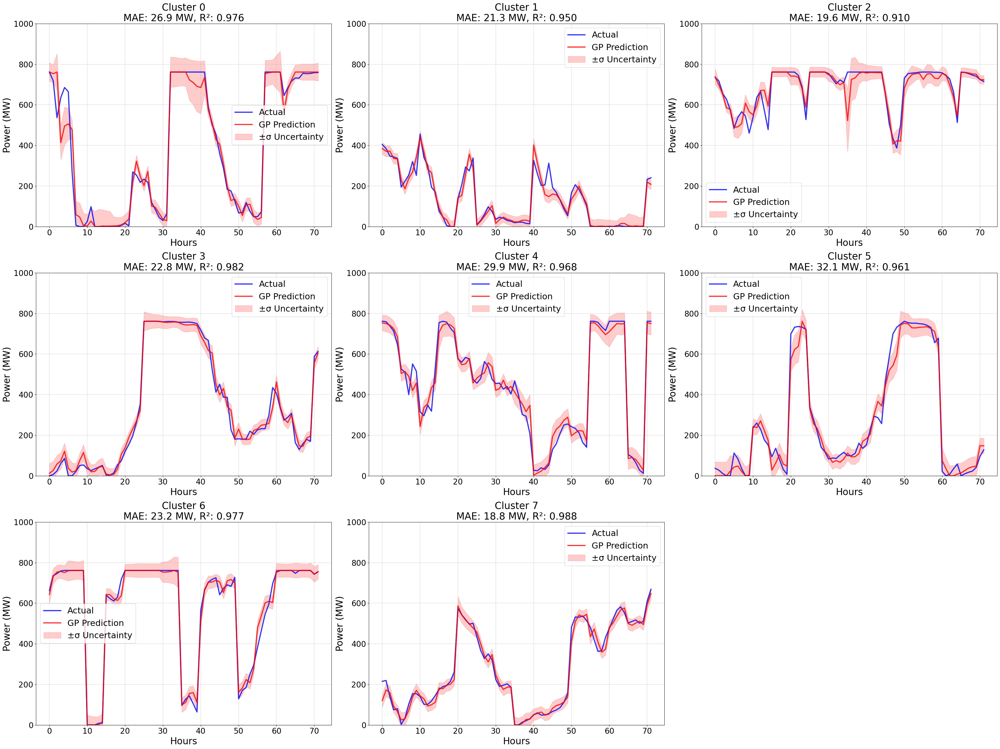


Prediction Plot Summary:
Cluster 0: MAE=26.9 MW, R²=0.976 (1282 test points)
Cluster 1: MAE=21.3 MW, R²=0.950 (1345 test points)
Cluster 2: MAE=19.6 MW, R²=0.910 (1520 test points)
Cluster 3: MAE=22.8 MW, R²=0.982 (1850 test points)
Cluster 4: MAE=29.9 MW, R²=0.968 (1375 test points)
Cluster 5: MAE=32.1 MW, R²=0.961 (635 test points)
Cluster 6: MAE=23.2 MW, R²=0.977 (1440 test points)
Cluster 7: MAE=18.8 MW, R²=0.988 (770 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 40.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 4 rows
  Extracted: 2919 periods (skipped 0 discontinuous blocks)
  Full: (2919, 18, 6), VAE: (2919, 6, 6)
Timeseries randomly split into 1167 train periods and 1752 test periods
Assigning test periods to clusters
  Test latent features Shape: (1167, 8)
  Cluster 0: 139 test periods
  Cluster 1: 165 test periods
  Cluster 2: 178 test periods
  Cluster 3: 219 tes

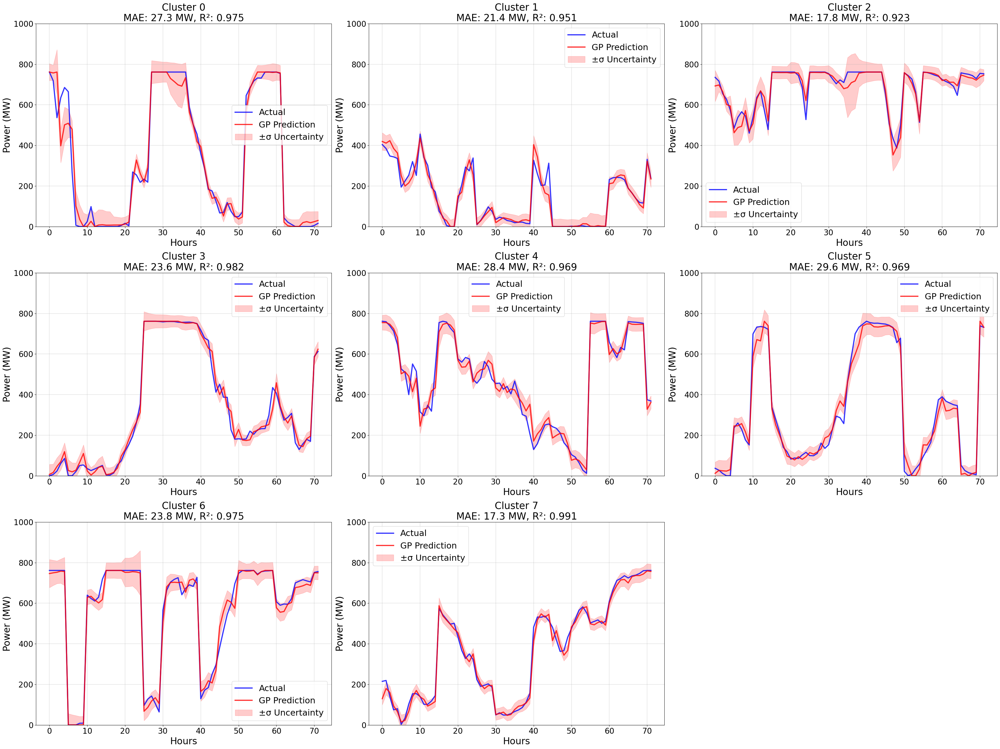


Prediction Plot Summary:
Cluster 0: MAE=27.3 MW, R²=0.975 (1127 test points)
Cluster 1: MAE=21.4 MW, R²=0.951 (1125 test points)
Cluster 2: MAE=17.8 MW, R²=0.923 (1295 test points)
Cluster 3: MAE=23.6 MW, R²=0.982 (1590 test points)
Cluster 4: MAE=28.4 MW, R²=0.969 (1195 test points)
Cluster 5: MAE=29.6 MW, R²=0.969 (545 test points)
Cluster 6: MAE=23.8 MW, R²=0.975 (1215 test points)
Cluster 7: MAE=17.3 MW, R²=0.991 (665 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 50.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 4 rows
  Extracted: 2919 periods (skipped 0 discontinuous blocks)
  Full: (2919, 18, 6), VAE: (2919, 6, 6)
Timeseries randomly split into 1459 train periods and 1460 test periods
Assigning test periods to clusters
  Test latent features Shape: (1459, 8)
  Cluster 0: 159 test periods
  Cluster 1: 204 test periods
  Cluster 2: 234 test periods
  Cluster 3: 270 tes

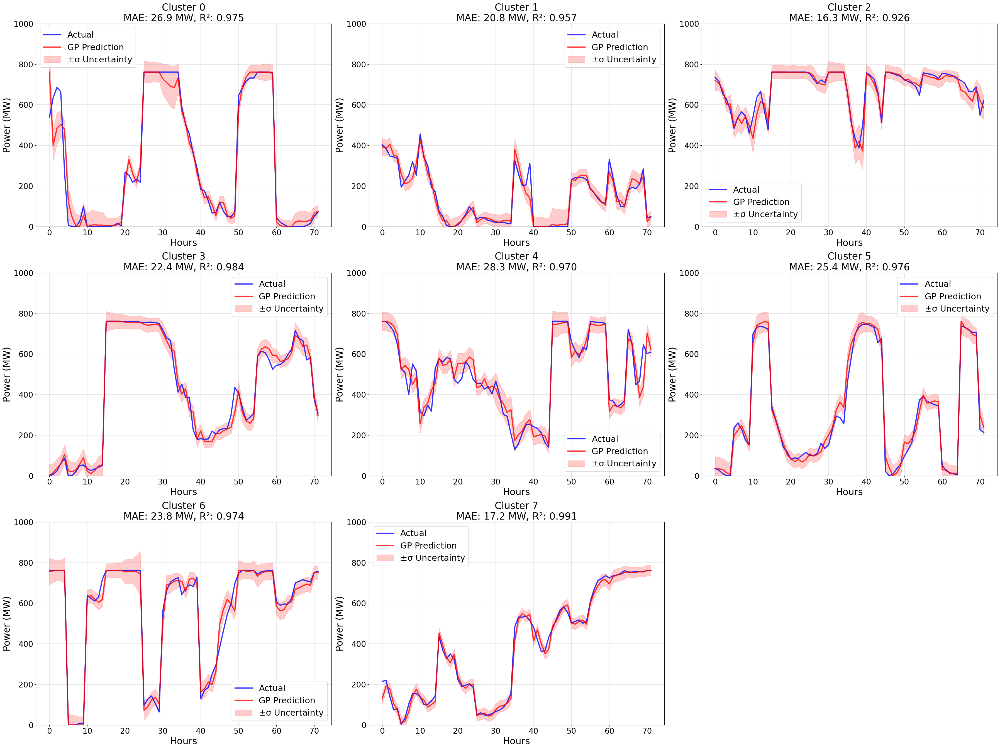


Prediction Plot Summary:
Cluster 0: MAE=26.9 MW, R²=0.975 (1030 test points)
Cluster 1: MAE=20.8 MW, R²=0.957 (930 test points)
Cluster 2: MAE=16.3 MW, R²=0.926 (1015 test points)
Cluster 3: MAE=22.4 MW, R²=0.984 (1335 test points)
Cluster 4: MAE=28.3 MW, R²=0.970 (955 test points)
Cluster 5: MAE=25.4 MW, R²=0.976 (465 test points)
Cluster 6: MAE=23.8 MW, R²=0.974 (1025 test points)
Cluster 7: MAE=17.2 MW, R²=0.991 (545 test points)

SUMMARY ACROSS ALL DATA FRACTIONS


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Horns Rev
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=fr'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\84',
        plot_predictions_flag=True,
        random_state=84
    )


EXPERIMENT: 10% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 10.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
Timeseries randomly split into 291 train periods and 2626 test periods
Assigning test periods to clusters
  Test latent features Shape: (291, 8)
  Cluster 0: 37 test periods
  Cluster 1: 27 test periods
  Cluster 2: 31 test periods
  Cluster 3: 33 test periods
  Cluster 4: 55 test periods
  Cluster 5: 31 test periods
  Cluster 6: 63 test periods
  Cluster 7: 14 test periods
Assigning test periods to clusters
  Test latent features Shape: (2626, 8)
  Cluster 0: 383 test periods
  Cluster 1: 215 test periods
  Cluster 2: 280 test periods
  Cluster 3: 349 test periods
  Cluster 4: 433 test periods
  Cluster 5: 290 test periods
  Cluster 6: 523 test periods
  Cluster 7: 153 test periods
Clust

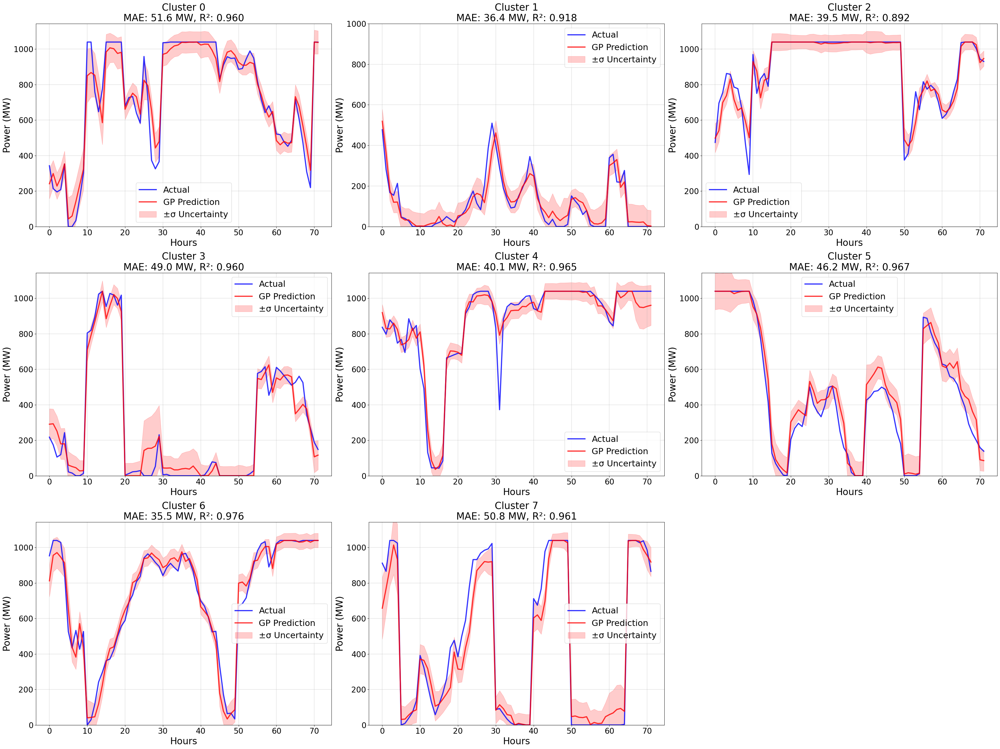


Prediction Plot Summary:
Cluster 0: MAE=51.6 MW, R²=0.960 (1915 test points)
Cluster 1: MAE=36.4 MW, R²=0.918 (1075 test points)
Cluster 2: MAE=39.5 MW, R²=0.892 (1400 test points)
Cluster 3: MAE=49.0 MW, R²=0.960 (1745 test points)
Cluster 4: MAE=40.1 MW, R²=0.965 (2162 test points)
Cluster 5: MAE=46.2 MW, R²=0.967 (1450 test points)
Cluster 6: MAE=35.5 MW, R²=0.976 (2615 test points)
Cluster 7: MAE=50.8 MW, R²=0.961 (765 test points)

EXPERIMENT: 20% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 20.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
Timeseries randomly split into 583 train periods and 2334 test periods
Assigning test periods to clusters
  Test latent features Shape: (583, 8)
  Cluster 0: 76 test periods
  Cluster 1: 49 test periods
  Cluster 2: 72 test periods
  Cluster 3: 78 test per

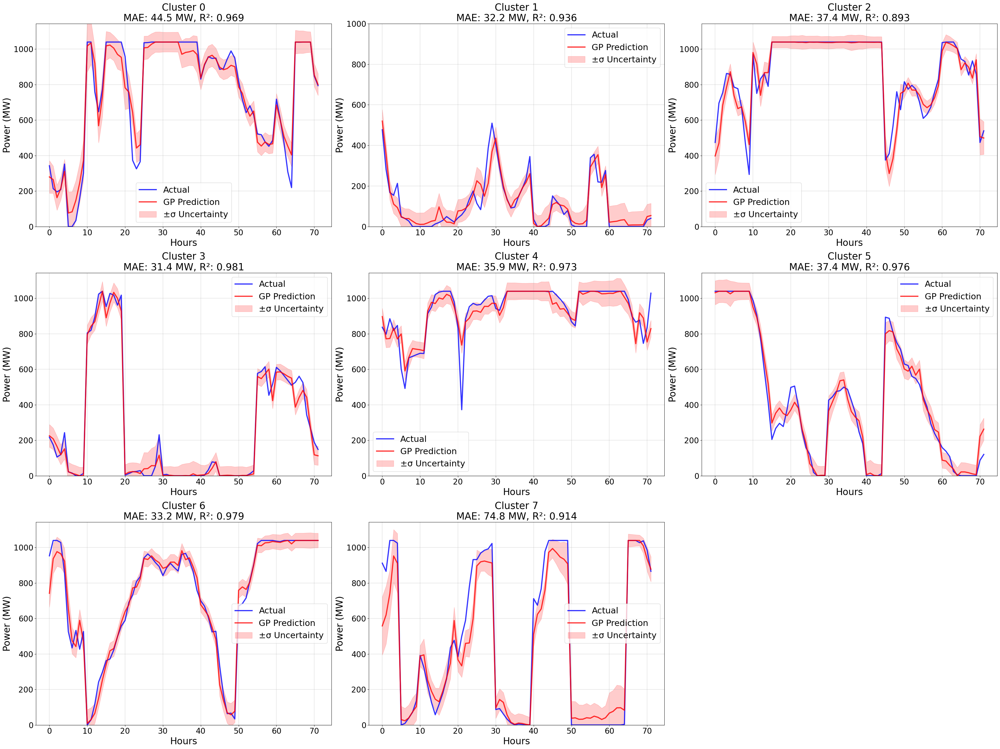


Prediction Plot Summary:
Cluster 0: MAE=44.5 MW, R²=0.969 (1720 test points)
Cluster 1: MAE=32.2 MW, R²=0.936 (965 test points)
Cluster 2: MAE=37.4 MW, R²=0.893 (1195 test points)
Cluster 3: MAE=31.4 MW, R²=0.981 (1520 test points)
Cluster 4: MAE=35.9 MW, R²=0.973 (1927 test points)
Cluster 5: MAE=37.4 MW, R²=0.976 (1285 test points)
Cluster 6: MAE=33.2 MW, R²=0.979 (2335 test points)
Cluster 7: MAE=74.8 MW, R²=0.914 (720 test points)

EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 30.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
Timeseries randomly split into 875 train periods and 2042 test periods
Assigning test periods to clusters
  Test latent features Shape: (875, 8)
  Cluster 0: 125 test periods
  Cluster 1: 73 test periods
  Cluster 2: 102 test periods
  Cluster 3: 119 test p

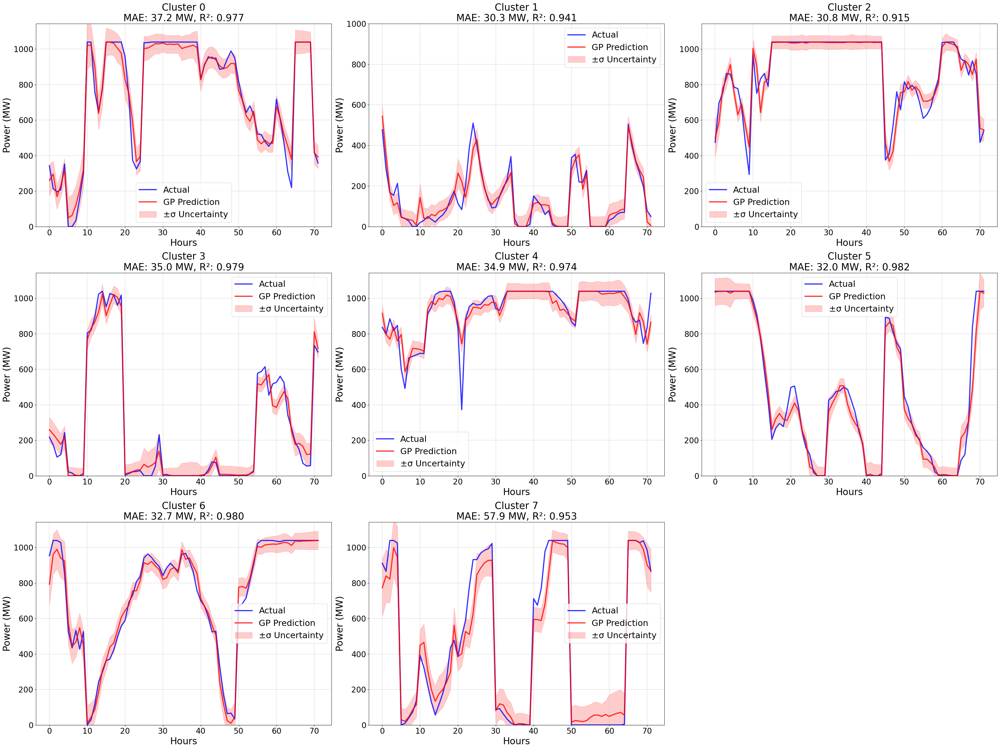


Prediction Plot Summary:
Cluster 0: MAE=37.2 MW, R²=0.977 (1475 test points)
Cluster 1: MAE=30.3 MW, R²=0.941 (845 test points)
Cluster 2: MAE=30.8 MW, R²=0.915 (1045 test points)
Cluster 3: MAE=35.0 MW, R²=0.979 (1315 test points)
Cluster 4: MAE=34.9 MW, R²=0.974 (1707 test points)
Cluster 5: MAE=32.0 MW, R²=0.982 (1145 test points)
Cluster 6: MAE=32.7 MW, R²=0.980 (2040 test points)
Cluster 7: MAE=57.9 MW, R²=0.953 (635 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 40.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
Timeseries randomly split into 1166 train periods and 1751 test periods
Assigning test periods to clusters
  Test latent features Shape: (1166, 8)
  Cluster 0: 166 test periods
  Cluster 1: 97 test periods
  Cluster 2: 132 test periods
  Cluster 3: 158 test

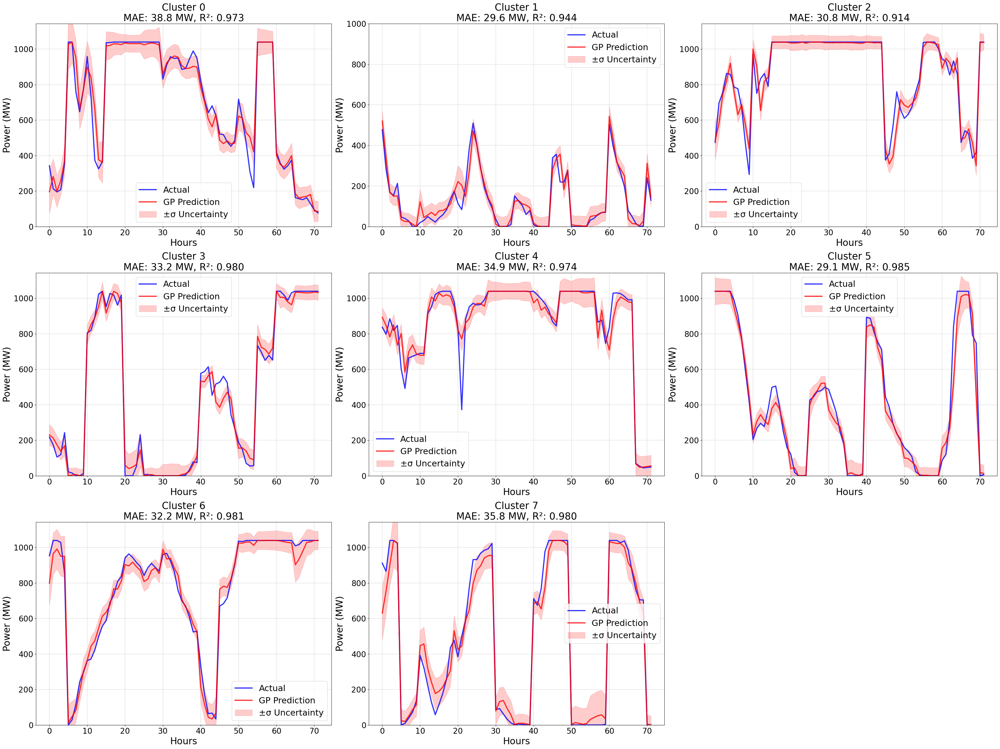


Prediction Plot Summary:
Cluster 0: MAE=38.8 MW, R²=0.973 (1270 test points)
Cluster 1: MAE=29.6 MW, R²=0.944 (725 test points)
Cluster 2: MAE=30.8 MW, R²=0.914 (895 test points)
Cluster 3: MAE=33.2 MW, R²=0.980 (1120 test points)
Cluster 4: MAE=34.9 MW, R²=0.974 (1457 test points)
Cluster 5: MAE=29.1 MW, R²=0.985 (970 test points)
Cluster 6: MAE=32.2 MW, R²=0.981 (1760 test points)
Cluster 7: MAE=35.8 MW, R²=0.980 (555 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 50.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 9 rows
  Extracted: 2917 periods (skipped 1 discontinuous blocks)
  Full: (2917, 18, 6), VAE: (2917, 6, 6)
Timeseries randomly split into 1458 train periods and 1459 test periods
Assigning test periods to clusters
  Test latent features Shape: (1458, 8)
  Cluster 0: 203 test periods
  Cluster 1: 124 test periods
  Cluster 2: 161 test periods
  Cluster 3: 197 test 

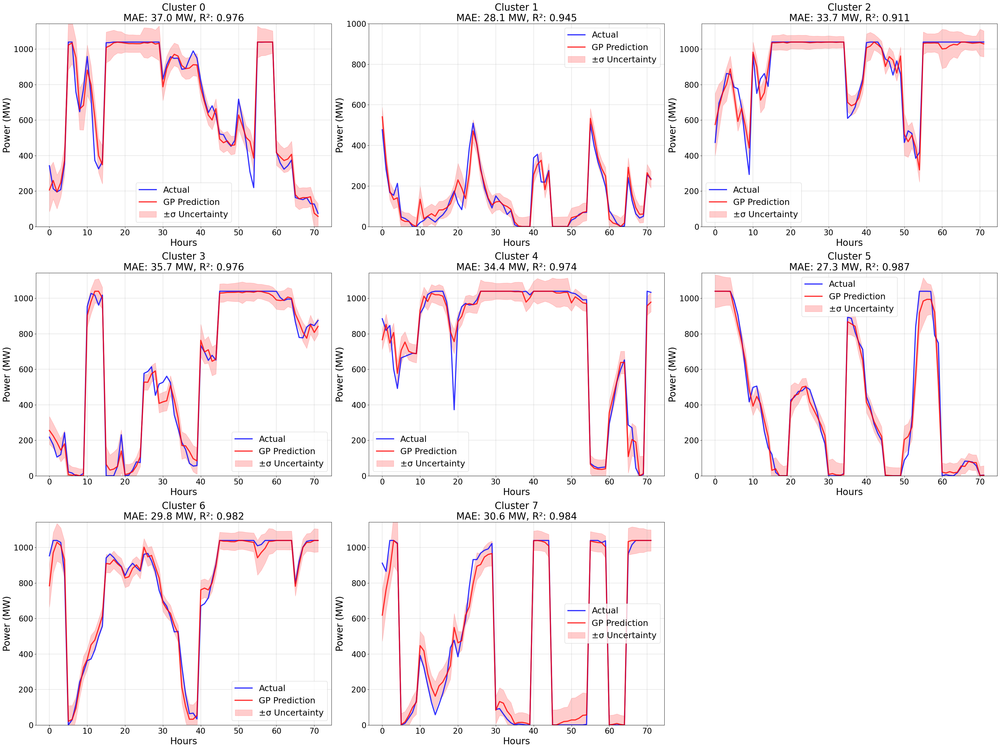


Prediction Plot Summary:
Cluster 0: MAE=37.0 MW, R²=0.976 (1085 test points)
Cluster 1: MAE=28.1 MW, R²=0.945 (590 test points)
Cluster 2: MAE=33.7 MW, R²=0.911 (750 test points)
Cluster 3: MAE=35.7 MW, R²=0.976 (925 test points)
Cluster 4: MAE=34.4 MW, R²=0.974 (1205 test points)
Cluster 5: MAE=27.3 MW, R²=0.987 (770 test points)
Cluster 6: MAE=29.8 MW, R²=0.982 (1495 test points)
Cluster 7: MAE=30.6 MW, R²=0.984 (475 test points)

SUMMARY ACROSS ALL DATA FRACTIONS


In [ ]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           #Seagreen
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=fr'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\84',
        plot_predictions_flag=True,
        random_state=84
    )


EXPERIMENT: 30% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 30.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 11 rows
  Extracted: 2914 periods (skipped 4 discontinuous blocks)
  Full: (2914, 18, 6), VAE: (2914, 6, 6)
Timeseries randomly split into 874 train periods and 2040 test periods
Assigning test periods to clusters
  Test latent features Shape: (874, 8)
  Cluster 0: 178 test periods
  Cluster 1: 150 test periods
  Cluster 2: 112 test periods
  Cluster 3: 122 test periods
  Cluster 4: 46 test periods
  Cluster 5: 149 test periods
  Cluster 6: 45 test periods
  Cluster 7: 72 test periods
Assigning test periods to clusters
  Test latent features Shape: (2040, 8)
  Cluster 0: 391 test periods
  Cluster 1: 402 test periods
  Cluster 2: 255 test periods
  Cluster 3: 254 test periods
  Cluster 4: 117 test periods
  Cluster 5: 314 test periods
  Cluster 6: 139 test periods
  Cluster 7: 168 test periods

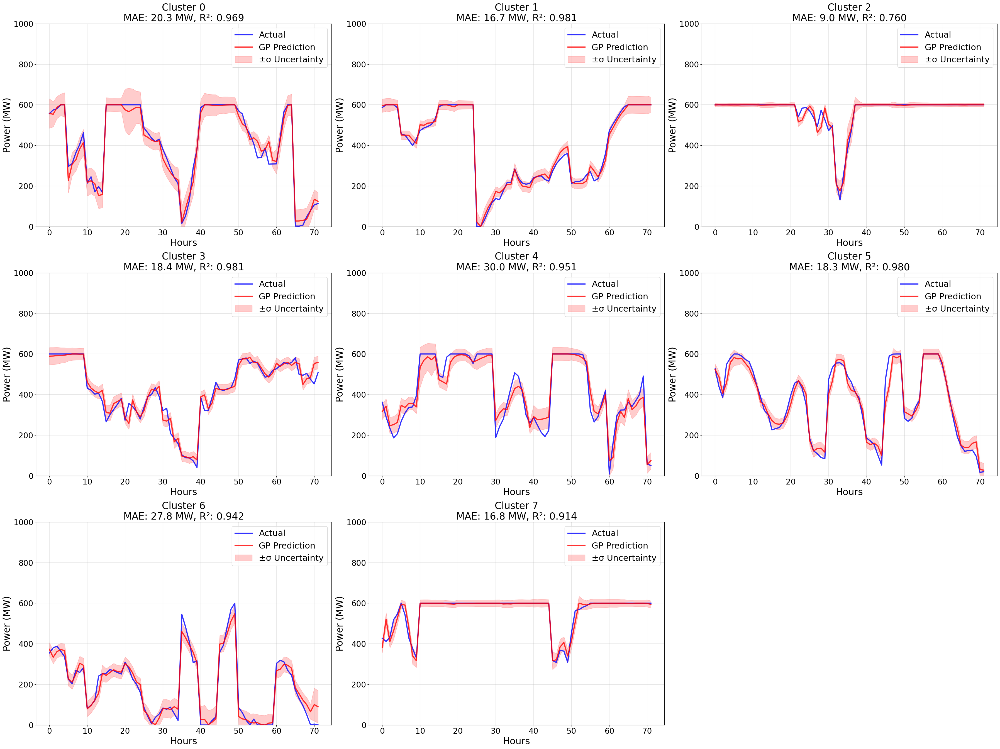


Prediction Plot Summary:
Cluster 0: MAE=20.3 MW, R²=0.969 (1955 test points)
Cluster 1: MAE=16.7 MW, R²=0.981 (2010 test points)
Cluster 2: MAE=9.0 MW, R²=0.760 (1272 test points)
Cluster 3: MAE=18.4 MW, R²=0.981 (1270 test points)
Cluster 4: MAE=30.0 MW, R²=0.951 (585 test points)
Cluster 5: MAE=18.3 MW, R²=0.980 (1570 test points)
Cluster 6: MAE=27.8 MW, R²=0.942 (695 test points)
Cluster 7: MAE=16.8 MW, R²=0.914 (840 test points)

EXPERIMENT: 40% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 40.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 11 rows
  Extracted: 2914 periods (skipped 4 discontinuous blocks)
  Full: (2914, 18, 6), VAE: (2914, 6, 6)
Timeseries randomly split into 1165 train periods and 1749 test periods
Assigning test periods to clusters
  Test latent features Shape: (1165, 8)
  Cluster 0: 238 test periods
  Cluster 1: 198 test periods
  Cluster 2: 163 test periods
  Cluster 3: 164 test

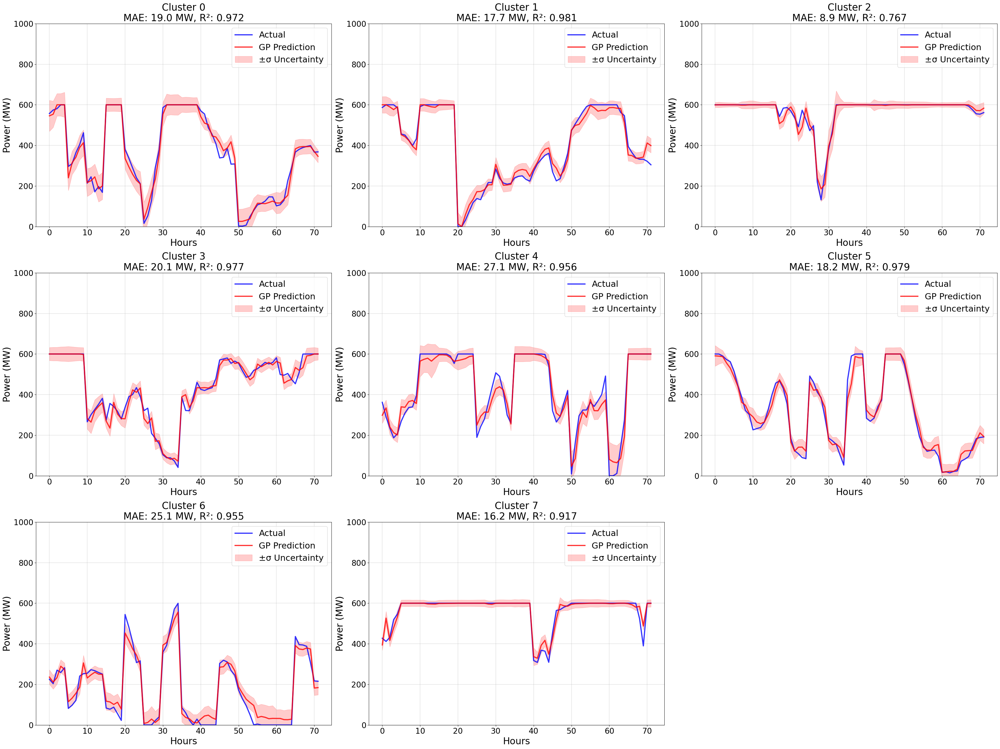


Prediction Plot Summary:
Cluster 0: MAE=19.0 MW, R²=0.972 (1655 test points)
Cluster 1: MAE=17.7 MW, R²=0.981 (1770 test points)
Cluster 2: MAE=8.9 MW, R²=0.767 (1017 test points)
Cluster 3: MAE=20.1 MW, R²=0.977 (1060 test points)
Cluster 4: MAE=27.1 MW, R²=0.956 (520 test points)
Cluster 5: MAE=18.2 MW, R²=0.979 (1390 test points)
Cluster 6: MAE=25.1 MW, R²=0.955 (585 test points)
Cluster 7: MAE=16.2 MW, R²=0.917 (745 test points)

EXPERIMENT: 50% TARGET DATA

GP TRANSFER LEARNING
Configuration: 6h periods, 8 clusters
Target data: 50.0% training

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 11 rows
  Extracted: 2914 periods (skipped 4 discontinuous blocks)
  Full: (2914, 18, 6), VAE: (2914, 6, 6)
Timeseries randomly split into 1457 train periods and 1457 test periods
Assigning test periods to clusters
  Test latent features Shape: (1457, 8)
  Cluster 0: 298 test periods
  Cluster 1: 256 test periods
  Cluster 2: 200 test periods
  Cluster 3: 195 test

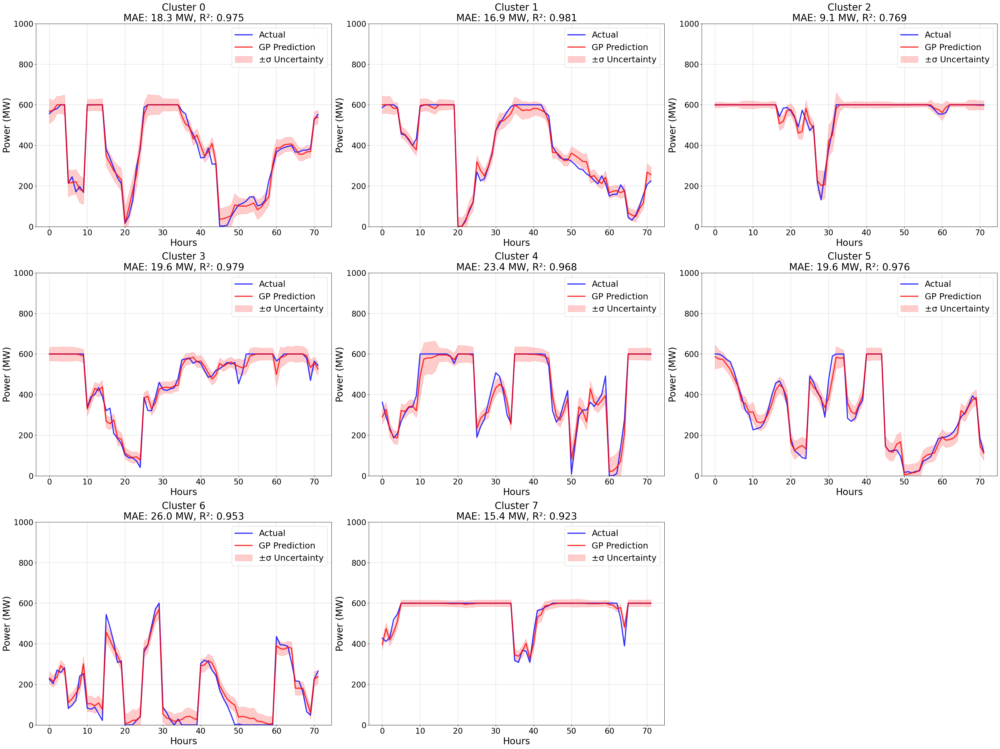


Prediction Plot Summary:
Cluster 0: MAE=18.3 MW, R²=0.975 (1355 test points)
Cluster 1: MAE=16.9 MW, R²=0.981 (1480 test points)
Cluster 2: MAE=9.1 MW, R²=0.769 (832 test points)
Cluster 3: MAE=19.6 MW, R²=0.979 (905 test points)
Cluster 4: MAE=23.4 MW, R²=0.968 (440 test points)
Cluster 5: MAE=19.6 MW, R²=0.976 (1145 test points)
Cluster 6: MAE=26.0 MW, R²=0.953 (505 test points)
Cluster 7: MAE=15.4 MW, R²=0.923 (620 test points)

SUMMARY ACROSS ALL DATA FRACTIONS


In [ ]:
fractions = [0.3, 0.4, 0.5]           #Gemini
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = transfer_learning_gp(
        target_df,
        source_results,
        data_fraction=frac,
        gp_dir=fr'C:\Users\dweis\OneDrive\Documents\Career\Research Paper\Models\63',
        plot_predictions_flag=True,
        random_state=63
    )

In [ ]:
def baseline_no_transfer(target_df, source_results, data_fraction=0.1, 
                          training_iterations=100, random_state=42):
    
    print("="*80)
    print("BASELINE: NO GP TRANSFER - TRAIN FROM SCRATCH")
    print("="*80)
    
    optimal_config = source_results['optimal_config']
    n_clusters = optimal_config['k_clusters']
    time_period_hours = optimal_config['time_period_hours']
    source_vae = optimal_config['vae']
    source_train_latent = optimal_config['train_latent']
    source_train_labels = optimal_config['train_cluster_labels']
    
    source_scalers_vae = optimal_config['scalers_vae']
    source_log_transforms_vae = optimal_config.get('log_transforms_vae', {})
    source_scalers_full = optimal_config['scalers_full']
    source_log_transforms_full = optimal_config.get('log_transforms_full', {})
    
    source_vae.eval()
    
    print(f"Configuration: {time_period_hours}h periods, {n_clusters} clusters")
    print(f"Target data: {data_fraction*100:.1f}% for training, {(1-data_fraction)*100:.1f}% for testing")
    print(f"Random seed: {random_state}")
    
    # DATA PREPARATION
    print("\n Extracting and Splitting...")
    timeseries_matrix_full_t, timeseries_matrix_vae_t, period_info_t = extract_timeseries(target_df, time_period_hours)
    
    test_ratio = 1.0 - data_fraction
    split_data_vae = split_timeperiods(timeseries_matrix_vae_t, period_info_t, test_ratio=test_ratio, random_state=random_state)
    
    train_indices = split_data_vae['train_indices']
    test_indices = split_data_vae['test_indices']
    train_period_info = split_data_vae['train_period_info']
    test_period_info = split_data_vae['test_period_info']
    
    train_timeseries_full_t = timeseries_matrix_full_t[train_indices]
    test_timeseries_full_t = timeseries_matrix_full_t[test_indices]
    train_timeseries_vae_t = split_data_vae['train_timeseries']
    test_timeseries_vae_t = split_data_vae['test_timeseries']
    
    # Normalisation
    vae_feature_names = ['Windspeed', 'fsr', 'u100', 'v100', 'wind_dir_sin', 'wind_dir_cos']
    train_normalised_vae_t = np.zeros_like(train_timeseries_vae_t, dtype=np.float32)
    test_normalised_vae_t = np.zeros_like(test_timeseries_vae_t, dtype=np.float32)

    for ch in range(train_timeseries_vae_t.shape[1]):
        channel_name = vae_feature_names[ch] if ch < len(vae_feature_names) else f'Channel_{ch}'
        if any(cyc in channel_name for cyc in ['sin', 'cos']):
            train_normalised_vae_t[:, ch, :] = train_timeseries_vae_t[:, ch, :]
            test_normalised_vae_t[:, ch, :] = test_timeseries_vae_t[:, ch, :]
            continue
        if channel_name in source_scalers_vae: 
            scaler_vae = source_scalers_vae[channel_name]   
            train_flat = train_timeseries_vae_t[:, ch, :].flatten()
            test_flat = test_timeseries_vae_t[:, ch, :].flatten()
            if source_log_transforms_vae.get(channel_name, False):
                train_flat = np.log(train_flat + 1e-10)
                test_flat = np.log(test_flat + 1e-10)
            train_scaled = scaler_vae.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler_vae.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_vae_t[:, ch, :] = train_scaled.reshape(train_timeseries_vae_t.shape[0], -1)
            test_normalised_vae_t[:, ch, :] = test_scaled.reshape(test_timeseries_vae_t.shape[0], -1)
        else:
             train_normalised_vae_t[:, ch, :] = train_timeseries_vae_t[:, ch, :]
             test_normalised_vae_t[:, ch, :] = test_timeseries_vae_t[:, ch, :]

    target_power_scaler = MinMaxScaler(feature_range=(-1, 1))
    raw_train_power = train_timeseries_full_t[:, 0, :].flatten().reshape(-1, 1)
    target_power_scaler.fit(raw_train_power)

    full_feature_names = [
        'Power', 'Windspeed', 'fsr', 'u100', 'v100',
        'Power_t-1', 'Power_t-2', 'Power_t-3',
        'Windspeed_t-1', 'Windspeed_t-2', 'Windspeed_t-3',
        'hour_sin', 'hour_cos', 'wind_dir_sin', 'wind_dir_cos',
        'month_sin', 'month_cos'
    ]

    train_normalised_full_t = np.zeros_like(train_timeseries_full_t, dtype=np.float32)
    test_normalised_full_t = np.zeros_like(test_timeseries_full_t, dtype=np.float32)

    for ch in range(train_timeseries_full_t.shape[1]):
        channel_name = full_feature_names[ch] if ch < len(full_feature_names) else f'Channel_{ch}'
        if any(cyc in channel_name for cyc in ['sin', 'cos']):
            train_normalised_full_t[:, ch, :] = train_timeseries_full_t[:, ch, :]
            test_normalised_full_t[:, ch, :] = test_timeseries_full_t[:, ch, :]
        elif 'Power' in channel_name:
            scaler = target_power_scaler
            train_flat = train_timeseries_full_t[:, ch, :].flatten()
            test_flat = test_timeseries_full_t[:, ch, :].flatten()
            train_scaled = scaler.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_full_t[:, ch, :] = train_scaled.reshape(train_timeseries_full_t.shape[0], -1)
            test_normalised_full_t[:, ch, :] = test_scaled.reshape(test_timeseries_full_t.shape[0], -1)
        elif channel_name in source_scalers_full:
            scaler = source_scalers_full[channel_name]
            train_flat = train_timeseries_full_t[:, ch, :].flatten()
            test_flat = test_timeseries_full_t[:, ch, :].flatten()
            if source_log_transforms_full.get(channel_name, False):
                train_flat = np.log(train_flat + 1e-10)
                test_flat = np.log(test_flat + 1e-10)
            train_scaled = scaler.transform(train_flat.reshape(-1, 1)).flatten()
            test_scaled = scaler.transform(test_flat.reshape(-1, 1)).flatten()
            train_normalised_full_t[:, ch, :] = train_scaled.reshape(train_timeseries_full_t.shape[0], -1)
            test_normalised_full_t[:, ch, :] = test_scaled.reshape(test_timeseries_full_t.shape[0], -1)
        else:
             train_normalised_full_t[:, ch, :] = train_timeseries_full_t[:, ch, :]
             test_normalised_full_t[:, ch, :] = test_timeseries_full_t[:, ch, :]

    train_latent_matrix_t = extract_vae_features(source_vae, train_normalised_vae_t, device='cpu')
    test_latent_matrix_t = extract_vae_features(source_vae, test_normalised_vae_t, device='cpu')
    
    train_cluster_labels_t = assign_test_clusters(source_train_latent, train_latent_matrix_t, source_train_labels)
    test_cluster_labels_t = assign_test_clusters(source_train_latent, test_latent_matrix_t, source_train_labels)
    all_source_clusters = sorted(np.unique(source_train_labels))
    
    train_cluster_dataset = create_cluster_forecasting_datasets(
        train_latent_matrix_t, train_normalised_full_t, train_cluster_labels_t,
        period_indices=np.arange(len(train_latent_matrix_t)),
        period_info=train_period_info,
        forecast_horizon=1
    )
    test_cluster_dataset = create_cluster_forecasting_datasets(
        test_latent_matrix_t, test_normalised_full_t, test_cluster_labels_t,
        period_indices=np.arange(len(test_latent_matrix_t)),
        period_info=test_period_info,
        forecast_horizon=1
    )
    
    def clean_dataset(dataset_dict):
        keys_to_remove = []
        for k in list(dataset_dict.keys()):
            X, y = dataset_dict[k]['X'], dataset_dict[k]['y']
            mask = ~np.isnan(X).any(axis=1) & ~np.isnan(y)
            dataset_dict[k]['X'] = X[mask]
            dataset_dict[k]['y'] = y[mask]
            if len(dataset_dict[k]['X']) == 0:
                keys_to_remove.append(k)
        for k in keys_to_remove:
            del dataset_dict[k]
    clean_dataset(train_cluster_dataset)
    clean_dataset(test_cluster_dataset)

    # TRAINING FROM SCRATCH
    
    print("\nStep 7: Training New GP models from Scratch...")
    print(f"  Training iterations: {training_iterations}")
    print(f"  Learning rate: 0.1")
    
    cluster_models = {}
    device = 'cpu'
    
    for cluster_id in all_source_clusters:
        if cluster_id not in train_cluster_dataset or cluster_id not in test_cluster_dataset:
            continue
        
        train_data = train_cluster_dataset[cluster_id]
        test_data = test_cluster_dataset[cluster_id]
        X_train, y_train = train_data['X'], train_data['y']
        X_test, y_test = test_data['X'], test_data['y']
        
        if len(X_train) < 10:
            continue
        
        print(f"\nCluster {cluster_id} ({len(X_train)} samples):", end=" ")
        
        train_x = torch.FloatTensor(X_train).to(device)
        train_y = torch.FloatTensor(y_train).to(device)
        test_x = torch.FloatTensor(X_test).to(device)
        
        # Initialisation
        target_likelihood = GaussianLikelihood(noise_constraint=None).to(device)
        target_model = GPModel(train_x, train_y, target_likelihood).to(device)
        
        target_model.train()
        target_likelihood.train()
        
        optimizer = torch.optim.Adam(target_model.parameters(), lr=0.1)
        mll = ExactMarginalLogLikelihood(target_likelihood, target_model)
        
        for i in range(training_iterations):
            optimizer.zero_grad()
            output = target_model(train_x)
            loss = -mll(output, train_y)
            if torch.isnan(loss) or torch.isinf(loss):
                break
            loss.backward()
            optimizer.step()
        
        target_model.eval()
        target_likelihood.eval()
        
        with torch.no_grad(), gpytorch.settings.fast_pred_var():
            predictions = target_likelihood(target_model(test_x))
            y_pred = predictions.mean.cpu().numpy()
            y_std = predictions.stddev.cpu().numpy()
        
        y_test_mw = target_power_scaler.inverse_transform(y_test.reshape(-1, 1)).ravel()
        y_pred_mw = target_power_scaler.inverse_transform(y_pred.reshape(-1, 1)).ravel()
        max_capacity = target_power_scaler.data_max_[0]
        y_pred_mw = np.clip(y_pred_mw, 0, max_capacity)
        
        mw_range = max_capacity - target_power_scaler.data_min_[0]
        feature_range_width = 2.0
        y_std_mw = y_std * (mw_range / feature_range_width)
        
        mae = mean_absolute_error(y_test_mw, y_pred_mw)
        r2 = r2_score(y_test_mw, y_pred_mw)
        rmse = np.sqrt(mean_squared_error(y_test_mw, y_pred_mw))
        
        print(f"MAE: {mae:.1f} MW, R²: {r2:.3f}")
        
        cluster_models[cluster_id] = {
            'gp': target_model,
            'likelihood': target_likelihood,
            'metrics': {'mae': mae, 'r2': r2, 'rmse': rmse, 'n_test': len(y_test)},
            'predictions_mw': y_pred_mw,
            'actuals_mw': y_test_mw,
            'uncertainties_mw': y_std_mw
        }
    
    if not cluster_models:
        raise RuntimeError("No GP models were successfully processed")
    
    # Calculate Overall Stats
    maes = [m['metrics']['mae'] for m in cluster_models.values()]
    weights = [m['metrics']['n_test'] for m in cluster_models.values()]
    total = sum(weights)
    w_mae = sum(m * w for m, w in zip(maes, weights)) / total
    
    mae_arr = np.array(maes)
    w_arr = np.array(weights) / total
    mae_std = np.sqrt(np.sum(w_arr * (mae_arr - w_mae)**2))
    
    r2s = [m['metrics']['r2'] for m in cluster_models.values()]
    r2_arr = np.array(r2s)
    w_r2 = np.sum(r2_arr * w_arr)
    r2_std = np.sqrt(np.sum(w_arr * (r2_arr - w_r2)**2))
    
    rmses = [m['metrics']['rmse'] for m in cluster_models.values()]
    rmse_arr = np.array(rmses)
    w_rmse = np.sum(rmse_arr * w_arr)
    rmse_std = np.sqrt(np.sum(w_arr * (rmse_arr - w_rmse)**2))

    print(f"\nOVERALL RESULTS:")
    print(f"MAE:  {w_mae:.2f} ± {mae_std:.2f} MW")
    print(f"R²:   {w_r2:.3f} ± {r2_std:.3f}")
    print(f"RMSE: {w_rmse:.2f} ± {rmse_std:.2f} MW")
    
    return {
        'cluster_models': cluster_models,
        'overall_metrics': {
            'mae_mean': w_mae, 'mae_std': mae_std,
            'r2_mean': w_r2, 'r2_std': r2_std,
            'rmse_mean': w_rmse, 'rmse_std': rmse_std
        },
        'data_fraction': data_fraction,
        'random_state': random_state
    }

In [15]:
fractions = [0.1, 0.2, 0.3, 0.4, 0.5]           
results_by_fraction = {}

for frac in fractions:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {frac*100:.0f}% TARGET DATA")
    print(f"{'='*80}\n")

    results = baseline_no_transfer(
        target_df,
        source_results,
        data_fraction=frac,
        training_iterations=100,
        random_state=84
    )
    results_by_fraction[frac] = results['overall_metrics']



print("\n" + "="*80)
print("SUMMARY ACROSS ALL DATA FRACTIONS")
print("="*80)
for frac in sorted(results_by_fraction.keys()):
    metrics = results_by_fraction[frac]
    print(f"{frac*100:3.0f}%: MAE={metrics['mae_mean']:5.2f}±{metrics['mae_std']:4.2f} MW, "
          f"R²={metrics['r2_mean']:.3f}±{metrics['r2_std']:.3f}")


EXPERIMENT: 10% TARGET DATA

BASELINE: NO GP TRANSFER - TRAIN FROM SCRATCH
Configuration: 6h periods, 8 clusters
Target data: 10.0% for training, 90.0% for testing
Random seed: 84

[Data Prep] Extracting and Splitting...
  Filtered 'Turn Off' events: Dropped 2 rows
  Extracted: 2918 periods (skipped 1 discontinuous blocks)
  Full: (2918, 18, 6), VAE: (2918, 6, 6)
Timeseries randomly split into 291 train periods and 2627 test periods
Assigning test periods to clusters
  Test latent features Shape: (291, 8)
  Cluster 0: 60 test periods
  Cluster 1: 26 test periods
  Cluster 2: 27 test periods
  Cluster 3: 38 test periods
  Cluster 4: 33 test periods
  Cluster 5: 27 test periods
  Cluster 6: 48 test periods
  Cluster 7: 32 test periods
Assigning test periods to clusters
  Test latent features Shape: (2627, 8)
  Cluster 0: 467 test periods
  Cluster 1: 262 test periods
  Cluster 2: 244 test periods
  Cluster 3: 356 test periods
  Cluster 4: 322 test periods
  Cluster 5: 314 test periods
 